In [1]:
# from google.colab import drive

# drive.mount('/content/gdrive')

In [2]:
# %cd /content/gdrive/My\ Drive/CMMD/notebooks

In [3]:
# !cd .. && pip install -r requirements.txt

Obtaining file:///home/gab/dt-test/cmmd/cmmd (from -r requirements.txt (line 2))


  Attempting uninstall: src
    Found existing installation: src 0.1.0
    Uninstalling src-0.1.0:
      Successfully uninstalled src-0.1.0
  Running setup.py develop for src


In [53]:
import pandas as pd
import numpy as np

import pydicom
import cv2
from tqdm import tqdm
from glob import glob

import matplotlib.pyplot as plt
from matplotlib import gridspec

import os, sys
if '..' not in sys.path:
    sys.path.append('..')

from src.data.make_dataset import map_preprocessing, preprocess_collection

nsamples=10

In [49]:
input_collection = '../data/raw'
processed_collection = '../data/processed/test'
collection_list_fn = 'collection_test_files.csv'

In [35]:
!python ../src/data/download_collection.py {input_collection} {collection_list_fn} -n 12

2021-07-26 15:29:53,275 - __main__ - INFO - getting collection series uids from /home/gab/dt-test/cmmd/cmmd/data/external/series.csv
2021-07-26 15:29:53,286 - __main__ - DEBUG - showing 3 samples out of 1775 from /home/gab/dt-test/cmmd/cmmd/data/external/series.csv...
2021-07-26 15:29:53,287 - __main__ - DEBUG -      PatientID  ... ImageCount
65     D1-0711  ...          2
1096   D2-0594  ...          4
1027   D2-0596  ...          4

[3 rows x 10 columns]
2021-07-26 15:29:53,304 - __main__ - DEBUG - found 1 `patient_name` column(s), using PatientID
2021-07-26 15:29:53,306 - __main__ - DEBUG - number of filtered series uids: 12
2021-07-26 15:29:53,306 - __main__ - INFO - downloading collection images to ../data/raw
100%|████████████████████████████████████████| 12/12 [00:00<00:00, 11413.07it/s]
2021-07-26 15:29:53,317 - __main__ - INFO - 50 collection references saved to ../data/raw/collection_test_files.csv
2021-07-26 15:29:53,322 - __main__ - DEBUG - 3 samples:
                      

In [48]:
!python ../src/data/make_dataset.py {os.path.join(input_collection, collection_list_fn)} {processed_collection}

2021-07-26 15:59:18,599 - __main__ - INFO - found 50 file paths from ../data/raw/collection_test_files.csv
2021-07-26 15:59:18,599 - __main__ - DEBUG - sampling 3 collection references
2021-07-26 15:59:18,605 - __main__ - DEBUG -                                     SeriesInstanceUID                                           filepath
13  1.3.6.1.4.1.14519.5.2.1.1239.1759.153294998168...  ../data/raw/1.3.6.1.4.1.14519.5.2.1.1239.1759....
39  1.3.6.1.4.1.14519.5.2.1.1239.1759.311973464371...  ../data/raw/1.3.6.1.4.1.14519.5.2.1.1239.1759....
30  1.3.6.1.4.1.14519.5.2.1.1239.1759.211016554248...  ../data/raw/1.3.6.1.4.1.14519.5.2.1.1239.1759....
2021-07-26 15:59:18,605 - __main__ - INFO - preparing folders for prepocessing
2021-07-26 15:59:18,608 - __main__ - INFO - preprocessing images, saving to ../data/processed/test
2021-07-26 15:59:18,608 - __main__ - INFO - preserving original input folder structure as in ../data/raw
50it [00:20,  2.46it/s]
2021-07-26 15:59:38,951 - __main__ - INFO -

In [54]:
pandas_colwidth = pd.get_option('display.max_colwidth')
pd.set_option('display.max_colwidth', pandas_colwidth*3)

processed_ref_fp = os.path.join(processed_collection, collection_list_fn)
_ = pd.read_csv(processed_ref_fp)
_.sample(3, random_state=42, replace=False)

,original_fp,preprocessed_fp
13,../data/raw/1.3.6.1.4.1.14519.5.2.1.1239.1759.153294998168394770999546663829/3-53bd5b8a8329a6d74efc1099dccdf7b4.dcm,../data/processed/test/1.3.6.1.4.1.14519.5.2.1.1239.1759.153294998168394770999546663829/3-53bd5b8a8329a6d74efc1099dccdf7b4.png
39,../data/raw/1.3.6.1.4.1.14519.5.2.1.1239.1759.311973464371044118785124178801/2-b1192b4ceb0a3974cdf9c6d9bbc049e8.dcm,../data/processed/test/1.3.6.1.4.1.14519.5.2.1.1239.1759.311973464371044118785124178801/2-b1192b4ceb0a3974cdf9c6d9bbc049e8.png
30,../data/raw/1.3.6.1.4.1.14519.5.2.1.1239.1759.211016554248520633664912835125/4-b5f8150eb0ede332fbdd4678083af3b8.dcm,../data/processed/test/1.3.6.1.4.1.14519.5.2.1.1239.1759.211016554248520633664912835125/4-b5f8150eb0ede332fbdd4678083af3b8.png


In [4]:
!python ../src/data/make_dataset.py ../data/raw ../data/processed

2021-07-26 12:16:25,097 - __main__ - INFO - getting collection series uids from /home/gab/dt-test/cmmd/cmmd/data/external/series.csv
2021-07-26 12:16:25,113 - __main__ - DEBUG - showing 3 samples from series fp...
2021-07-26 12:16:25,115 - __main__ - DEBUG -      PatientID  ... ImageCount
65     D1-0711  ...          2
1096   D2-0594  ...          4
1027   D2-0596  ...          4

[3 rows x 10 columns]
2021-07-26 12:16:25,132 - __main__ - DEBUG - number of original series uids: 1775
2021-07-26 12:16:25,132 - __main__ - DEBUG - found 1 `patient_name` column(s), using PatientID
2021-07-26 12:16:25,134 - __main__ - DEBUG - number of filtered series uids: 10
2021-07-26 12:16:25,134 - __main__ - INFO - getting collection images from ../data/raw
100%|████████████████████████████████████████| 10/10 [00:00<00:00, 11187.79it/s]
2021-07-26 12:16:25,145 - __main__ - INFO - saving 34 filepaths references to /home/gab/dt-test/cmmd/cmmd/references/collection_files_list.csv
2021-07-26 12:16:25,146 - 

In [ ]:
ref = pd.read_csv('../references/collection_files_list.csv', index_col=0)
print(ref.shape)
ref.sample(3, random_state=42, replace=False)

In [32]:
dir(pydicom.dcmread('../data/raw/1.3.6.1.4.1.14519.5.2.1.1239.1759.136125005667579154507905678479/1-6770f7583f79f1711a349abdfcdb5393.dcm', stop_before_pixels=True))
#type(pydicom.dcmread('../data/raw/1.3.6.1.4.1.14519.5.2.1.1239.1759.136125005667579154507905678479/1-6770f7583f79f1711a349abdfcdb5393.dcm'))

['AccessionNumber',
 'AcquisitionContextSequence',
 'AcquisitionDate',
 'AcquisitionTime',
 'AnatomicRegionSequence',
 'BitsAllocated',
 'BitsStored',
 'BodyPartExamined',
 'BurnedInAnnotation',
 'Columns',
 'ContentDate',
 'ContentTime',
 'DeidentificationMethod',
 'DeidentificationMethodCodeSequence',
 'DetectorType',
 'HighBit',
 'ImageLaterality',
 'ImageType',
 'ImagerPixelSpacing',
 'InstanceCreationDate',
 'InstanceCreationTime',
 'InstanceCreatorUID',
 'InstanceNumber',
 'LongitudinalTemporalInformationModified',
 'LossyImageCompression',
 'Manufacturer',
 'Modality',
 'OrganExposed',
 'PatientAge',
 'PatientBirthDate',
 'PatientID',
 'PatientIdentityRemoved',
 'PatientName',
 'PatientOrientation',
 'PatientSex',
 'PhotometricInterpretation',
 'PixelIntensityRelationship',
 'PixelIntensityRelationshipSign',
 'PixelRepresentation',
 'PositionerType',
 'PresentationIntentType',
 'PresentationLUTShape',
 'ReferringPhysicianName',
 'RescaleIntercept',
 'RescaleSlope',
 'RescaleType

In [31]:
pydicom.dcmread('../data/raw/1.3.6.1.4.1.14519.5.2.1.1239.1759.136125005667579154507905678479/1-6770f7583f79f1711a349abdfcdb5393.dcm').PixelData

b'\x8528<7/<<?=.4504206>:>2728,:7K<8\'().>ACA219;BR5:><822,2C4)/5*&&(,+90**$#2(* ("\x1b\x1c\x1d\x1b\x1c!%\x1d\x1d\x1c\x16\x12\x1a\x19\x19\x1b\x15\x12\x12\x12\x14\x12\x12\x16\x15\x11\x0c\x0e\x10\x12\x13\x11\x0f\n\x0c\x0f\x0b\x0c\x0e\x10\x0e\x0b\x10\x12\x15\x0f\x12\x1b \x15\x16\x19\x12\x10\x14\x10\x0f\x0e\x0e\x11\x0e\x14\r\x0c\x0e\x17\x16\x14\x0e\x0e\r\x0e\x16\x14\x11\x0f\x12\x14\x14\x16\x0e\r\x0f\x11\x12\x10\x0e\x0e\x0e\x11\x10\x0e\x0e\x0c\x0e\x0e\x0f\x0f\r\x0b\x0c\x0b\x0b\x10\x10\x12\x10\x0c\x0b\r\x0f\x0f\x0e\x0c\x0c\x0e\x10\x0e\r\x0f\x0e\x11\x10\x0f\r\x0e\x0e\r\r\x15\x16\x16\x14\x0e\x12\x10\x0f\x0f\x0f\r\x0f\x14\x10\x0e\x0e\r\x12\x0e\x13\x0f\x0f\x0e\x13\r\x0c\x08\x0b\r\x12\x12\x11\x0f\x0e\x0f\x11\x0f\x12\x0c\x10\x12\x16\x10\n\x0e\x16\x13\x0e\x0b\x0f\x0c\x0b\r\r\x0c\x0c\n\x0b\x0c\n\x0c\x0e\r\x0e\x0e\r\x0e\x0f\x0e\x10\r\n\t\n\x0c\n\x0b\x0c\r\x0e\x0b\t\t\t\x07\t\x0c\x0e\r\x0e\x0f\x0f\r\x0b\x0b\r\r\x10\x0e\x0e\x0e\r\r\x0f\x0c\x0e\x0b\x0e\x0c\n\x0c\x0b\x0c\r\x11\x11\x0f\x0c\t\x0b\r\x10\x0f

In [3]:
candidates = np.random.choice(ref['filepath'], nsamples, replace=False)
maps = map_preprocessing(candidates, '../data/external/', '../data/processed/test/')
maps = pd.DataFrame(pd.Series(maps, name='preprocessed_fp'))
maps.index.name = 'original_fp'
maps = maps['preprocessed_fp']
print(len(maps))
maps.sample(3, random_state=42, replace=False)

(34, 1)
10


original_fp
../data/raw/1.3.6.1.4.1.14519.5.2.1.1239.1759.136125005667579154507905678479/1-6770f7583f79f1711a349abdfcdb5393.dcm    ../data/raw/1.3.6.1.4.1.14519.5.2.1.1239.1759....
../data/raw/1.3.6.1.4.1.14519.5.2.1.1239.1759.170338507449551315505391016132/3-7831c4daf310b82055236ac5b46615f8.dcm    ../data/raw/1.3.6.1.4.1.14519.5.2.1.1239.1759....
../data/raw/1.3.6.1.4.1.14519.5.2.1.1239.1759.211016554248520633664912835125/1-316ffff7599a0b8698ca508efd37ef50.dcm    ../data/raw/1.3.6.1.4.1.14519.5.2.1.1239.1759....
Name: preprocessed_fp, dtype: object

In [26]:
{k:v for k, v in maps.items()}

{'../data/external/G__neg/BC_P34/an_dicom_2.dcm': '../data/processed/test/G__neg/BC_P34/an_dicom_2.png',
 '../data/external/G__pos/BC_P14/an_DCM0001.dcm': '../data/processed/test/G__pos/BC_P14/an_DCM0001.png',
 '../data/external/G__pos/BC_P40/an_DCM0001.dcm': '../data/processed/test/G__pos/BC_P40/an_DCM0001.png',
 '../data/external/G__neg/BC_P25/an_dicom.dcm': '../data/processed/test/G__neg/BC_P25/an_dicom.png',
 '../data/external/G__pos/BC_P22/an_DCM0001.dcm': '../data/processed/test/G__pos/BC_P22/an_DCM0001.png',
 '../data/external/G__neg/BC_P12/an_DCM0000.dcm': '../data/processed/test/G__neg/BC_P12/an_DCM0000.png',
 '../data/external/G__neg/BC_P31/an_dicom.dcm': '../data/processed/test/G__neg/BC_P31/an_dicom.png',
 '../data/external/G__pos/BC_P53/an_dicom.dcm': '../data/processed/test/G__pos/BC_P53/an_dicom.png',
 '../data/external/G__neg/BC_P09/an_DCM0000.dcm': '../data/processed/test/G__neg/BC_P09/an_DCM0000.png',
 '../data/external/G__neg/BC_P56/an_dicom.dcm': '../data/processed/

In [11]:
preprocess_collection(maps, overwrite=False)

10it [00:31,  3.14s/it]


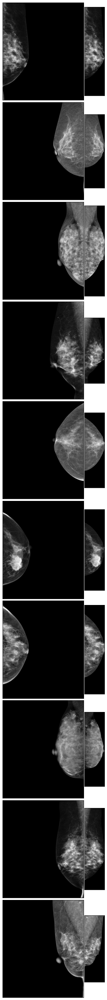

In [12]:
fig = plt.figure(figsize=(5,int(5*nsamples)))
plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.01, hspace=0.01)
axes = gridspec.GridSpec(len(maps), 2, width_ratios=[4, 1]) 

for i, (k, v) in enumerate(maps.iteritems()):
    ax = fig.add_subplot(axes[i, 0])
    dcm = pydicom.dcmread(k).pixel_array
    dcmax=np.max(dcm)
    ax.imshow(dcm, cmap='Greys_r', vmax=dcmax)
    
    ax = fig.add_subplot(axes[i, 1])
    png = cv2.imread(v, cv2.IMREAD_UNCHANGED)
    ax.imshow(png, cmap='Greys_r')
for ax in fig.get_axes():
    ax.tick_params(bottom=False, labelbottom=False, left=False, labelleft=False)
plt.show()

In [21]:
fps = glob('../data/external/G__*/**/*')
print(len(fps))
np.random.seed(42)
np.random.choice(fps, 3, replace=False)

52


array(['../data/external/G__neg/BC_P34/an_dicom_2.dcm',
       '../data/external/G__pos/BC_P14/an_DCM0001.dcm',
       '../data/external/G__pos/BC_P40/an_DCM0001.dcm'], dtype='<U45')

In [22]:
np.random.seed(42)
candidates_ = np.random.choice(fps, nsamples, replace=False)
maps = map_preprocessing(candidates_, '../data/external/', '../data/processed/test/')
maps = pd.DataFrame(pd.Series(maps, name='preprocessed_fp'))
maps.index.name = 'original_fp'
maps = maps['preprocessed_fp']
maps.sample(3, random_state=42, replace=False)

original_fp
../data/external/G__neg/BC_P09/an_DCM0000.dcm    ../data/processed/test/G__neg/BC_P09/an_DCM000...
../data/external/G__pos/BC_P14/an_DCM0001.dcm    ../data/processed/test/G__pos/BC_P14/an_DCM000...
../data/external/G__neg/BC_P12/an_DCM0000.dcm    ../data/processed/test/G__neg/BC_P12/an_DCM000...
Name: preprocessed_fp, dtype: object

In [17]:
preprocess_collection(maps, overwrite=False)

10it [01:19,  7.93s/it]


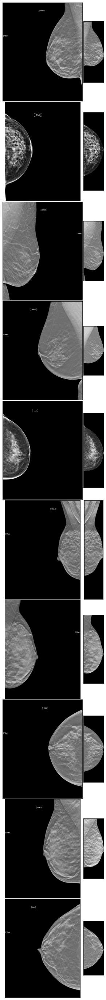

In [18]:
fig = plt.figure(figsize=(5,int(5*nsamples)))
axes = gridspec.GridSpec(len(maps), 2, width_ratios=[4, 1]) 
plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.01, hspace=0.01)

for i, (k, v) in enumerate(maps.items()):
    ax = fig.add_subplot(axes[i, 0])
    dcm = pydicom.dcmread(k).pixel_array
    dcmax=np.max(dcm)
    ax.imshow(dcm, cmap='Greys_r',)# vmax=dcmax)
    
    ax = fig.add_subplot(axes[i, 1])
    png = cv2.imread(v, cv2.IMREAD_UNCHANGED)
    ax.imshow(png, cmap='Greys_r')
for ax in fig.get_axes():
    ax.tick_params(bottom=False, labelbottom=False, left=False, labelleft=False)
plt.show()

In [ ]:
stop

In [25]:
from src.data.make_dataset import left_mamm, clean_mamm, get_act_width, cut_mamm, remove_outline, remove_border_artifacts

def preprocess_mamm(mamm, outline_erosion_radius=200, artifact_lower_t=0.8, artifact_left_w=0.1, artifact_min_area=2000):
    # put it on the left
    mamm = left_mamm(mamm)
    mamm = clean_mamm(mamm)
    # identify column where background starts
    act_w = get_act_width(mamm)
    mamm = cut_mamm(mamm, act_w, first_n_col_to_drop=0)
    # erode to remove breast outline
    mamm = remove_outline(mamm, outline_erosion_radius)
    # cut again
    act_w = get_act_width(mamm)
    mamm = cut_mamm(mamm, act_w, first_n_col_to_drop=0)

    # mamm = remove_border_artifacts(mamm, artifact_lower_t, artifact_left_w, artifact_min_area)
def preprocess_mamm(mamm, erosion_diam=200, artifact_lower_t=0.8, artifact_left_w=0.1, artifact_min_area=2000):
    steps = [mamm.copy()]
    # put it on the left
    mamm = left_mamm(mamm)
    steps.append(mamm.copy())
    mamm = clean_mamm(mamm)
    steps.append(mamm.copy())
    # identify column where background starts
    act_w = get_act_width(mamm)
    mamm = cut_mamm(mamm, act_w, first_n_col_to_drop=0)
    steps.append(mamm.copy())
    # erode to remove breast outline
    mamm = remove_outline(mamm, erosion_diam=200)
    steps.append(mamm.copy())
    # cut again
    act_w = get_act_width(mamm)
    mamm = cut_mamm(mamm, act_w, first_n_col_to_drop=0)
    steps.append(mamm.copy())
    
    mamm = remove_border_artifacts(mamm, artifact_lower_t, artifact_left_w, artifact_min_area)
    steps.append(mamm.copy())
    return steps


def preprocess_collection(maps: dict, overwrite=False):
    """ turns mammografies into preprocessed pngs ready for segmentation
        returns dataframe of mapping orig->preprocessed.png
    """
    mammss = []
    for input_fp, output_png in tqdm(maps.items()):
        if not overwrite and os.path.exists(output_png):
            continue
        if os.path.exists(output_png):
            os.remove(output_png)
        if input_fp.endswith('dcm'):
            mamm = pydicom.dcmread(input_fp).pixel_array
        else:
            mamm = cv2.imread(input_fp, cv2.IMREAD_UNCHANGED)
        mamms = preprocess_mamm(mamm)
        # mamm = np.stack((mamm, mamm, mamm), 2) if len(mamm.shape)==2 else mamm
        cv2.imwrite(output_png, mamm)
        mammss.append(mamms)
    return mammss